# The Data

There are four data files associated with this project:

- `Udacity_AZDIAS_052018.csv`: Demographics data for the general population of Germany; 891 211 persons (rows) x 366 features (columns).
- `Udacity_CUSTOMERS_052018.csv`: Demographics data for customers of a mail-order company; 191 652 persons (rows) x 369 features (columns).
- `Udacity_MAILOUT_052018_TRAIN.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 982 persons (rows) x 367 (columns).
- `Udacity_MAILOUT_052018_TEST.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 833 persons (rows) x 366 (columns).

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. We will use the information from the first two files to figure out how customers ("CUSTOMERS") are similar to or differ from the general population at large ("AZDIAS"), then use our analysis to make predictions on the other two files ("MAILOUT"), predicting which recipients are most likely to become a customer for the mail-order company.

The "CUSTOMERS" file contains three extra columns ('CUSTOMER_GROUP', 'ONLINE_PURCHASE', and 'PRODUCT_GROUP'), which provide broad information about the customers depicted in the file. The original "MAILOUT" file included one additional column, "RESPONSE", which indicated whether or not each recipient became a customer of the company. For the "TRAIN" subset, this column has been retained, but in the "TEST" subset it has been removed; it is against that withheld column that our final predictions will be assessed in a Kaggle competition.

Otherwise, all of the remaining columns are the same between the three data files. For more information about the columns depicted in the files, we refer to two Excel spreadsheets:
- `DIAS Information Levels - Attributes 2017.xlsx`: is a top-level list of attributes and descriptions, organized by informational category. 
- `DIAS Attributes - Values 2017.xlsx`: is a detailed mapping of data values for each feature in alphabetical order.

In the below cell, we load in the first two datasets. Note for all of the `.csv` data files in this project that they're semicolon (`;`) delimited, so an additional argument in the [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call has been included to read in the data properly. Also, considering the size of the datasets, it may take some time for them to load completely.

Notice when the data is loaded in that a warning message will immediately pop up. Before we start digging into the modeling and analysis, we're going to need to perform some cleaning. In this notebook we browse the structure of the data and look over the informational spreadsheets to understand the data values. We will explain our decisions on which features to keep, which features to drop, and make some revisions on data formats. Lastly, we'll compile all steps in a function which resides in `clean_data.py` since we'll need to clean all of the datasets as well.

In [ ]:
import importlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#clean data module
import clean_data


%matplotlib inline
SEED = 42

In [2]:
# load in the data
azdias = pd.read_csv('Udacity_AZDIAS_052018.csv', sep=';')
customers = pd.read_csv('Udacity_CUSTOMERS_052018.csv', sep=';')

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (18,19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


## Data Processing and Cleaning

### 1. Duplicates and data types

In [3]:
azdias.head(10)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,910215,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1,2
1,910220,-1,9.0,0.0,NaN,NaN,NaN,NaN,21.0,11.0,...,4.0,8.0,11.0,10.0,3.0,9.0,4.0,5,2,1
2,910225,-1,9.0,17.0,NaN,NaN,NaN,NaN,17.0,10.0,...,2.0,9.0,9.0,6.0,3.0,9.0,2.0,5,2,3
3,910226,2,1.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,0.0,7.0,10.0,11.0,NaN,9.0,7.0,3,2,4
4,910241,-1,1.0,20.0,NaN,NaN,NaN,NaN,14.0,3.0,...,2.0,3.0,5.0,4.0,2.0,9.0,3.0,4,1,3
5,910244,3,1.0,10.0,NaN,NaN,NaN,NaN,10.0,5.0,...,2.0,10.0,7.0,4.0,6.0,9.0,7.0,4,2,1
6,910248,-1,9.0,0.0,NaN,NaN,NaN,NaN,NaN,4.0,...,2.0,7.0,10.0,10.0,3.0,9.0,5.0,4,2,2
7,910261,-1,1.0,14.0,NaN,NaN,NaN,NaN,14.0,6.0,...,2.0,10.0,12.0,9.0,5.0,9.0,1.0,1,1,1
8,645145,-1,9.0,16.0,NaN,NaN,NaN,NaN,16.0,2.0,...,4.0,8.0,11.0,8.0,5.0,8.0,1.0,6,1,3
9,645153,-1,5.0,17.0,NaN,NaN,NaN,NaN,17.0,9.0,...,4.0,1.0,1.0,1.0,4.0,3.0,7.0,4,2,3


In [4]:
customers.head(10)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,PRODUCT_GROUP,CUSTOMER_GROUP,ONLINE_PURCHASE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,9626,2,1.0,10.0,NaN,NaN,NaN,NaN,10.0,1.0,...,2.0,6.0,9.0,7.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
1,9628,-1,9.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,0.0,9.0,NaN,3,FOOD,SINGLE_BUYER,0,1,4
2,143872,-1,1.0,6.0,NaN,NaN,NaN,NaN,0.0,1.0,...,11.0,6.0,9.0,2.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,2,4
3,143873,1,1.0,8.0,NaN,NaN,NaN,NaN,8.0,0.0,...,2.0,NaN,9.0,7.0,1,COSMETIC,MULTI_BUYER,0,1,4
4,143874,-1,1.0,20.0,NaN,NaN,NaN,NaN,14.0,7.0,...,4.0,2.0,9.0,3.0,1,FOOD,MULTI_BUYER,0,1,3
5,143888,1,1.0,11.0,NaN,NaN,NaN,NaN,10.0,1.0,...,1.0,6.0,9.0,1.0,2,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,3
6,143904,2,1.0,10.0,NaN,NaN,NaN,NaN,10.0,1.0,...,2.0,6.0,9.0,7.0,1,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
7,143910,1,1.0,10.0,NaN,NaN,NaN,NaN,9.0,1.0,...,1.0,6.0,9.0,3.0,3,FOOD,SINGLE_BUYER,0,1,4
8,102160,2,3.0,5.0,NaN,NaN,NaN,NaN,4.0,74.0,...,9.0,6.0,3.0,4.0,3,COSMETIC,MULTI_BUYER,0,2,4
9,102173,1,1.0,20.0,NaN,NaN,NaN,NaN,13.0,1.0,...,4.0,2.0,9.0,5.0,1,COSMETIC,MULTI_BUYER,0,1,3


First, a routine check for duplicate rows.

In [5]:
azdias.duplicated().sum(), customers.duplicated().sum()

(0, 0)

Next, let's verify if the customers data exists in the azdias data. 

In [6]:
#Drop the LNR column and columns not common to both data frames
azdias.drop(['LNR'], axis=1, inplace = True)
customers_X = customers.drop(['LNR','PRODUCT_GROUP', 'CUSTOMER_GROUP' ,'ONLINE_PURCHASE'], axis=1)

#Append the customers df below the azdias df and verify if there are duplicate rows
azdias.append(customers_X, ignore_index=True).duplicated().sum()

88246

There are in fact 88246 rows common to both data frames. This could be possibly due to clients that live outside of Germany but it can be verified with Arvato for clarification.

Now let's address the warning messages.

In [7]:
azdias.columns[18:20], customers.columns[18:20]

(Index(['CAMEO_INTL_2015', 'CJT_GESAMTTYP'], dtype='object'),
 Index(['CAMEO_DEUG_2015', 'CAMEO_INTL_2015'], dtype='object'))

In [8]:
azdias.CAMEO_DEUG_2015.unique(), azdias.CAMEO_INTL_2015.unique()

(array([nan, 8.0, 4.0, 2.0, 6.0, 1.0, 9.0, 5.0, 7.0, 3.0, '4', '3', '7',
        '2', '8', '9', '6', '5', '1', 'X'], dtype=object),
 array([nan, 51.0, 24.0, 12.0, 43.0, 54.0, 22.0, 14.0, 13.0, 15.0, 33.0,
        41.0, 34.0, 55.0, 25.0, 23.0, 31.0, 52.0, 35.0, 45.0, 44.0, 32.0,
        '22', '24', '41', '12', '54', '51', '44', '35', '23', '25', '14',
        '34', '52', '55', '31', '32', '15', '13', '43', '33', '45', 'XX'],
       dtype=object))

Let's check for other columns with mixed data types and uniformize their types. This will have to be done manually since the type of values on each of this columns vary. To idenfify the columns of dtype object in a dataframe we use the following function.

In [9]:
def object_type_cols(df):
    "Returns data frame with dtype object columns in df"
    df_o_cols = df.select_dtypes(np.dtype("O")).columns
    return df[df_o_cols]

In [10]:
object_type_cols(azdias)

,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ
0,NaN,NaN,NaN,NaN,NaN,NaN
1,8A,8,51,NaN,1992-02-10 00:00:00,W
2,4C,4,24,D19_UNBEKANNT,1992-02-12 00:00:00,W
3,2A,2,12,D19_UNBEKANNT,1997-04-21 00:00:00,W
4,6B,6,43,D19_SCHUHE,1992-02-12 00:00:00,W
...,...,...,...,...,...,...
891216,7A,7,41,D19_HAUS_DEKO,1992-02-10 00:00:00,W
891217,9D,9,51,D19_UNBEKANNT,1992-02-10 00:00:00,W
891218,4C,4,24,D19_BEKLEIDUNG_GEH,1992-02-10 00:00:00,W
891219,9D,9,51,D19_UNBEKANNT,1992-02-12 00:00:00,W


In [11]:
object_type_cols(customers)

,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ,PRODUCT_GROUP,CUSTOMER_GROUP
0,1A,1,13,D19_UNBEKANNT,1992-02-12 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
1,NaN,NaN,NaN,D19_BANKEN_GROSS,NaN,NaN,FOOD,SINGLE_BUYER
2,5D,5,34,D19_UNBEKANNT,1992-02-10 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
3,4C,4,24,D19_NAHRUNGSERGAENZUNG,1992-02-10 00:00:00,W,COSMETIC,MULTI_BUYER
4,7B,7,41,D19_SCHUHE,1992-02-12 00:00:00,W,FOOD,MULTI_BUYER
...,...,...,...,...,...,...,...,...
191647,1C,1,14,D19_BANKEN_REST,1992-02-10 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
191648,5B,5,32,D19_UNBEKANNT,1997-03-06 00:00:00,W,COSMETIC,SINGLE_BUYER
191649,4D,4,24,D19_TECHNIK,1992-02-10 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
191650,4C,4,24,D19_BANKEN_REST,1992-02-10 00:00:00,W,FOOD,SINGLE_BUYER


The decription of the columns CAMEO_DEU_2015, CAMEO_DEUG_2015, CAMEO_INTL_2015 shows that the  information in this columns is redudant and it's enough to keep CAMEO_DEUG_2015.

In [12]:
azdias.drop(['CAMEO_DEU_2015', 'CAMEO_INTL_2015'], axis=1, inplace = True)
customers.drop(['CAMEO_DEU_2015', 'CAMEO_INTL_2015'], axis=1, inplace = True)

The following function converts some strange values in the columns flagged in the warning message and converts the EINGEFUEGT_AM dtype into a datetime object.

In [13]:
def object_cols_clean(df):
    """
    Replaces 'X', 'XX' with np.nan and strings to float on column CAMEO_DEUG_2015
    Converts EINGEFUEGT_AM column values to datetime
    """
    
    df['CAMEO_DEUG_2015'] = df['CAMEO_DEUG_2015'].replace({"X": np.nan, "XX": np.nan})
    df['CAMEO_DEUG_2015'] = df['CAMEO_DEUG_2015'].astype(float)
    
    df["EINGEFUEGT_AM"] = pd.to_datetime(df["EINGEFUEGT_AM"])
    df["EINGEFUEGT_AM"] = df['EINGEFUEGT_AM'].map(lambda x: x.year)
    
    return df

In [14]:
azdias = object_cols_clean(azdias)
customers = object_cols_clean(customers)

A routine check for duplicate rows.

In [15]:
azdias.duplicated().sum(), customers.duplicated().sum()

(45782, 0)

Most columns are categorical with numerical values. 

In [16]:
azdias_data_types = azdias.dtypes
azdias_d_types = pd.DataFrame({'Column': azdias_data_types.index, 'Type': azdias_data_types.values})
azdias_d_types.groupby(['Type']).count()

,Column
Type,
int64,92
float64,269
object,2


In [17]:
cust_data_types = customers.dtypes
cust_d_types = pd.DataFrame({'Column':cust_data_types.index, 'Type': cust_data_types.values})
cust_d_types.groupby(['Type']).count()

,Column
Type,
int64,94
float64,269
object,4


## 1.2 Missing Attributes 

There are some attributes in the demographics data in azdias that are not described in the spreadsheet `DIAS Attributes - Values 2017.xlsx`. The spreadsheet `DIAS Attributes - Values 2017.xlsx` contains most attributes on azdias and customers with descriptions, organized by informational category.

In [18]:
#load attribute description and unknown values
attributes_values = pd.read_excel('DIAS Attributes - Values 2017.xlsx', header=1). drop(['Unnamed: 0'], axis=1)
attributes_values

,Attribute,Description,Value,Meaning
0,AGER_TYP,best-ager typology,-1,unknown
1,NaN,NaN,0,no classification possible
2,NaN,NaN,1,passive elderly
3,NaN,NaN,2,cultural elderly
4,NaN,NaN,3,experience-driven elderly
...,...,...,...,...
2253,NaN,NaN,2,smart
2254,NaN,NaN,3,fair supplied
2255,NaN,NaN,4,price driven
2256,NaN,NaN,5,seeking orientation


Here are the features in azdias that do not appear in `attributes_values`.

In [19]:
set(azdias.columns.values) - set(attributes_values['Attribute'].values)

{'AKT_DAT_KL',
 'ALTERSKATEGORIE_FEIN',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'ANZ_KINDER',
 'ANZ_STATISTISCHE_HAUSHALTE',
 'ARBEIT',
 'CJT_KATALOGNUTZER',
 'CJT_TYP_1',
 'CJT_TYP_2',
 'CJT_TYP_3',
 'CJT_TYP_4',
 'CJT_TYP_5',
 'CJT_TYP_6',
 'D19_BANKEN_DIREKT',
 'D19_BANKEN_GROSS',
 'D19_BANKEN_LOKAL',
 'D19_BANKEN_REST',
 'D19_BEKLEIDUNG_GEH',
 'D19_BEKLEIDUNG_REST',
 'D19_BILDUNG',
 'D19_BIO_OEKO',
 'D19_BUCH_CD',
 'D19_DIGIT_SERV',
 'D19_DROGERIEARTIKEL',
 'D19_ENERGIE',
 'D19_FREIZEIT',
 'D19_GARTEN',
 'D19_HANDWERK',
 'D19_HAUS_DEKO',
 'D19_KINDERARTIKEL',
 'D19_KONSUMTYP_MAX',
 'D19_KOSMETIK',
 'D19_LEBENSMITTEL',
 'D19_LETZTER_KAUF_BRANCHE',
 'D19_LOTTO',
 'D19_NAHRUNGSERGAENZUNG',
 'D19_RATGEBER',
 'D19_REISEN',
 'D19_SAMMELARTIKEL',
 'D19_SCHUHE',
 'D19_SONSTIGE',
 'D19_SOZIALES',
 'D19_TECHNIK',
 'D19_TELKO_MOBILE',
 'D19_TELKO_ONLINE_QUOTE_12',
 'D19_TELKO_REST',
 'D19_TIERARTIKEL',
 'D19_VERSAND_REST',
 'D19_VERSICHERUNGEN',
 'D19_VERSI_DATUM',
 '

Features that start with `D19_` do appear in attributes_values but with an `_ RZ` at the end so they should be included in this list.

In [20]:
transaction_cols = {'D19_BANKEN_DIREKT',
 'D19_BANKEN_GROSS',
 'D19_BANKEN_LOKAL',
 'D19_BANKEN_REST',
 'D19_BEKLEIDUNG_GEH',
 'D19_BEKLEIDUNG_REST',
 'D19_BILDUNG',
 'D19_BIO_OEKO',
 'D19_BUCH_CD',
 'D19_DIGIT_SERV',
 'D19_DROGERIEARTIKEL',
 'D19_ENERGIE',
 'D19_FREIZEIT',
 'D19_GARTEN',
 'D19_HANDWERK',
 'D19_HAUS_DEKO',
 'D19_KINDERARTIKEL',
 'D19_KONSUMTYP_MAX',
 'D19_KOSMETIK',
 'D19_LEBENSMITTEL',
 'D19_LOTTO',
 'D19_NAHRUNGSERGAENZUNG',
 'D19_RATGEBER',
 'D19_REISEN',
 'D19_SAMMELARTIKEL',
 'D19_SCHUHE',
 'D19_SONSTIGE',
 'D19_SOZIALES',
 'D19_TECHNIK',
 'D19_TELKO_MOBILE',
 'D19_TELKO_ONLINE_QUOTE_12',
 'D19_TELKO_REST',
 'D19_TIERARTIKEL',
 'D19_VERSAND_REST',
 'D19_VERSICHERUNGEN',
 'D19_VERSI_DATUM',
 'D19_VERSI_OFFLINE_DATUM',
 'D19_VERSI_ONLINE_DATUM',
 'D19_VERSI_ONLINE_QUOTE_12',
 'D19_VOLLSORTIMENT',
 'D19_WEIN_FEINKOST'}

In [21]:
cols_not_described = (set(azdias.columns.values) - transaction_cols) - set(attributes_values['Attribute'].values)

In [22]:
azdias[cols_not_described]

,CJT_TYP_4,HH_DELTA_FLAG,ALTER_KIND4,STRUKTURTYP,CJT_TYP_5,KBA13_ANTG2,KBA13_GBZ,RT_UEBERGROESSE,KOMBIALTER,ANZ_STATISTISCHE_HAUSHALTE,...,EXTSEL992,ALTER_KIND3,UNGLEICHENN_FLAG,KK_KUNDENTYP,CJT_KATALOGNUTZER,VERDICHTUNGSRAUM,KBA13_KMH_210,KBA13_ANTG3,D19_LETZTER_KAUF_BRANCHE,FIRMENDICHTE
0,5.0,NaN,NaN,NaN,5.0,NaN,NaN,1.0,9,NaN,...,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN
1,3.0,0.0,NaN,2.0,1.0,4.0,4.0,5.0,1,12.0,...,NaN,NaN,1.0,NaN,1.0,0.0,4.0,2.0,NaN,2.0
2,3.0,0.0,NaN,3.0,2.0,3.0,4.0,5.0,2,7.0,...,14.0,NaN,0.0,NaN,2.0,1.0,4.0,1.0,D19_UNBEKANNT,4.0
3,4.0,NaN,NaN,1.0,5.0,3.0,4.0,3.0,4,2.0,...,31.0,NaN,0.0,NaN,3.0,0.0,2.0,1.0,D19_UNBEKANNT,4.0
4,4.0,0.0,NaN,3.0,3.0,4.0,3.0,5.0,3,3.0,...,NaN,NaN,0.0,1.0,3.0,1.0,3.0,2.0,D19_SCHUHE,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
891216,3.0,0.0,NaN,NaN,1.0,3.0,3.0,5.0,2,11.0,...,NaN,NaN,0.0,3.0,2.0,NaN,3.0,1.0,D19_HAUS_DEKO,4.0
891217,3.0,0.0,NaN,3.0,1.0,4.0,3.0,3.0,3,11.0,...,NaN,NaN,0.0,NaN,3.0,0.0,4.0,3.0,D19_UNBEKANNT,1.0
891218,1.0,NaN,NaN,2.0,1.0,2.0,4.0,5.0,2,3.0,...,NaN,NaN,0.0,NaN,1.0,0.0,3.0,0.0,D19_BEKLEIDUNG_GEH,4.0
891219,2.0,0.0,NaN,3.0,2.0,3.0,1.0,3.0,1,5.0,...,19.0,NaN,0.0,NaN,3.0,1.0,2.0,3.0,D19_UNBEKANNT,3.0


In [23]:
len(cols_not_described)

51

#### (Optional) Drop columns of attributes not described

An optional step is to drop those columns in cols_not_described as they will not offer any interpretability later in our customer segmentation. It is important to know the meaning of each column so that the clusters can be interpreted. This can be done with the following commands.

In [24]:
azdias.drop(list(cols_not_described), axis = 'columns', inplace = False)

,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEUG_2015,CJT_GESAMTTYP,D19_BANKEN_ANZ_12,...,SEMIO_VERT,SHOPPER_TYP,TITEL_KZ,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0,...,1,-1,NaN,-1,NaN,NaN,NaN,3,1,2
1,-1,0.0,11.0,0.0,2.0,0.0,6.0,8.0,5.0,0,...,1,3,0.0,2,3.0,9.0,4.0,5,2,1
2,-1,17.0,10.0,0.0,1.0,0.0,2.0,4.0,3.0,0,...,4,2,0.0,1,3.0,9.0,2.0,5,2,3
3,2,13.0,1.0,0.0,0.0,0.0,4.0,2.0,2.0,0,...,4,1,0.0,1,NaN,9.0,7.0,3,2,4
4,-1,20.0,3.0,0.0,4.0,0.0,2.0,6.0,5.0,3,...,7,2,0.0,2,2.0,9.0,3.0,4,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
891216,-1,17.0,15.0,0.0,1.0,0.0,6.0,7.0,5.0,0,...,2,3,0.0,1,3.0,4.0,3.0,4,2,3
891217,-1,16.0,11.0,0.0,1.0,0.0,7.0,9.0,4.0,0,...,4,-1,0.0,-1,6.0,9.0,5.0,6,1,2
891218,-1,17.0,3.0,0.0,0.0,0.0,5.0,4.0,4.0,0,...,2,2,0.0,1,NaN,5.0,7.0,4,2,2
891219,-1,0.0,7.0,0.0,1.0,0.0,2.0,9.0,3.0,0,...,6,0,0.0,2,1.0,9.0,5.0,5,1,1


In [25]:
customers.drop(list(cols_not_described), axis = 'columns', inplace = False)

,LNR,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEUG_2015,CJT_GESAMTTYP,...,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,PRODUCT_GROUP,CUSTOMER_GROUP,ONLINE_PURCHASE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,9626,2,10.0,1.0,0.0,2.0,0.0,3.0,1.0,5.0,...,1,6.0,9.0,7.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
1,9628,-1,11.0,NaN,NaN,3.0,0.0,NaN,NaN,NaN,...,1,0.0,9.0,NaN,3,FOOD,SINGLE_BUYER,0,1,4
2,143872,-1,6.0,1.0,0.0,1.0,0.0,7.0,5.0,2.0,...,2,6.0,9.0,2.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,2,4
3,143873,1,8.0,0.0,NaN,0.0,0.0,7.0,4.0,2.0,...,1,NaN,9.0,7.0,1,COSMETIC,MULTI_BUYER,0,1,4
4,143874,-1,20.0,7.0,0.0,4.0,0.0,3.0,7.0,6.0,...,2,2.0,9.0,3.0,1,FOOD,MULTI_BUYER,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191647,154561,1,9.0,1.0,0.0,1.0,0.0,1.0,1.0,4.0,...,2,6.0,9.0,1.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,3
191648,154563,-1,0.0,0.0,NaN,0.0,0.0,6.0,5.0,2.0,...,2,NaN,9.0,3.0,3,COSMETIC,SINGLE_BUYER,0,2,4
191649,148813,2,15.0,1.0,0.0,3.0,0.0,7.0,4.0,2.0,...,1,3.0,9.0,3.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
191650,148852,3,13.0,4.0,0.0,4.0,0.0,3.0,4.0,4.0,...,1,4.0,9.0,2.0,3,FOOD,SINGLE_BUYER,0,2,3


### 3. Strange values

Some values in our data sets do not have a meaning description in `attributes_values`. We'll regard these as strange values and write functions to convert such values to NaNs. The following script will generate the list `attr_values_clean` with each categorical attribute in `DIAS Attributes - Values 2017.xlsx` and its possible values.

In [26]:
#reformat the data frame so each value is in line with its corresponding attribute
attributes_values["Attribute"] = attributes_values["Attribute"].ffill()

#create a list possible values paired with their corresponding attribute and drop attributes whose value is '...'
colons_drop = attributes_values[attributes_values['Value']=='…'].Attribute.values
lista = list(attributes_values.groupby(['Attribute', 'Value']).count().drop(colons_drop).index)


#merge values with common attributes
result = {}
for sub_tuple in lista:
    if sub_tuple[0] in result:
        result[sub_tuple[0]] = (*result[sub_tuple[0]], *sub_tuple[1:])
    else:
        result[sub_tuple[0]] = sub_tuple

lista2 = list(result.values())

#create list of sublist with attributes and its values
lista3 = [[x[0],list(x[1:])] for x in lista2]

#converts values that should be numerical but were entered as strings 
def attribute_values_clean(values):
    if '-1, 0' in values[1]:
        values[1].remove('-1, 0')
        values[1].extend([-1,0])
    if '-1, 9' in values[1]:
        values[1].remove('-1, 9')
        values[1].extend([-1, 9])
    if '-1' in values[1]:
        values[1].remove('-1')
        values[1].extend([-1])
    values[1] = list(set(values[1]))
    return values

attr_values_clean = list(map(attribute_values_clean,lista3))

#list of categorical attributes and their values 
attr_values_clean

[['AGER_TYP', [0, 1, 2, 3, -1]],
 ['ALTERSKATEGORIE_GROB', [0, 1, 2, 3, 4, 9, -1]],
 ['ALTER_HH',
  [0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21]],
 ['ANREDE_KZ', [0, 1, 2, -1]],
 ['BALLRAUM', [1, 2, 3, 4, 5, 6, 7, -1]],
 ['BIP_FLAG', [0, 1, -1]],
 ['CAMEO_DEUG_2015', [1, 2, 3, 4, 5, 6, 7, 8, 9, -1]],
 ['CAMEO_DEUINTL_2015',
  [11,
   12,
   13,
   14,
   15,
   21,
   22,
   23,
   24,
   25,
   31,
   32,
   33,
   34,
   35,
   41,
   42,
   43,
   44,
   45,
   51,
   52,
   53,
   54,
   55,
   -1]],
 ['CAMEO_DEU_2015',
  ['5B',
   '3A',
   '4B',
   '7A',
   '3D',
   '9D',
   '7C',
   '9B',
   '5A',
   '2D',
   '9A',
   '6A',
   '4D',
   '6C',
   '2B',
   '4A',
   '5C',
   '7D',
   '9E',
   '4C',
   '8C',
   '3B',
   '5F',
   '7E',
   '5E',
   '3C',
   '1D',
   '9C',
   '1B',
   '4E',
   '6D',
   '1A',
   '6E',
   '5D',
   '6F',
   '8B',
   '8A',
   '2C',
   '1C',
   '8D',
   '1E',
   '

We will use the list attr_values_clean to convert possible strange or unknown values appearing on columns described DIAS Attributes - Values 2017.xlsx but not defined, into NaNs.

In [27]:
def replace_strange_with_nan(strange, values):
    "Replaces a strange value (not in attr_values_clean) with np.nan"
    if (strange in values) or (np.isnan(strange)):
        return strange
    else:
        print("Replacing {} to NaN".format(strange))
        return np.nan

In [28]:
def strange_vals_replace(df):
    for column in df.columns:
        for value in attr_values_clean:
            if value[0] == column:
                print("In column {} ...".format(column))
                df[column] = df[column].apply(replace_strange_with_nan, args =([value[1]]))
    return df

In [29]:
azdias = strange_vals_replace(azdias)

In column AGER_TYP ...
In column ALTER_HH ...
In column BALLRAUM ...
In column CAMEO_DEUG_2015 ...
In column CJT_GESAMTTYP ...
In column D19_BANKEN_ANZ_12 ...
In column D19_BANKEN_ANZ_24 ...
In column D19_BANKEN_DATUM ...
In column D19_BANKEN_OFFLINE_DATUM ...
In column D19_BANKEN_ONLINE_DATUM ...
In column D19_BANKEN_ONLINE_QUOTE_12 ...
In column D19_GESAMT_ANZ_12 ...
In column D19_GESAMT_ANZ_24 ...
In column D19_GESAMT_DATUM ...
In column D19_GESAMT_OFFLINE_DATUM ...
In column D19_GESAMT_ONLINE_DATUM ...
In column D19_GESAMT_ONLINE_QUOTE_12 ...
In column D19_KONSUMTYP ...
In column D19_TELKO_ANZ_12 ...
In column D19_TELKO_ANZ_24 ...
In column D19_TELKO_DATUM ...
In column D19_TELKO_OFFLINE_DATUM ...
In column D19_TELKO_ONLINE_DATUM ...
In column D19_VERSAND_ANZ_12 ...
In column D19_VERSAND_ANZ_24 ...
In column D19_VERSAND_DATUM ...
In column D19_VERSAND_OFFLINE_DATUM ...
In column D19_VERSAND_ONLINE_DATUM ...
In column D19_VERSAND_ONLINE_QUOTE_12 ...
In column D19_VERSI_ANZ_12 ...
In

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

In column KBA05_MOTRAD ...
In column KBA05_SEG1 ...
In column KBA05_SEG10 ...
In column KBA05_SEG2 ...
In column KBA05_SEG3 ...
In column KBA05_SEG4 ...
In column KBA05_SEG5 ...
In column KBA05_SEG6 ...
In column KBA05_SEG7 ...
In column KBA05_SEG8 ...
In column KBA05_SEG9 ...
In column KBA05_VORB0 ...
In column KBA05_VORB1 ...
In column KBA05_VORB2 ...
In column KBA05_ZUL1 ...
In column KBA05_ZUL2 ...
In column KBA05_ZUL3 ...
In column KBA05_ZUL4 ...
In column KBA13_ALTERHALTER_30 ...
In column KBA13_ALTERHALTER_45 ...
In column KBA13_ALTERHALTER_60 ...
In column KBA13_ALTERHALTER_61 ...
In column KBA13_AUDI ...
In column KBA13_AUTOQUOTE ...
In column KBA13_BJ_1999 ...
In column KBA13_BJ_2000 ...
In column KBA13_BJ_2004 ...
In column KBA13_BJ_2006 ...
In column KBA13_BJ_2008 ...
In column KBA13_BJ_2009 ...
In column KBA13_BMW ...
In column KBA13_CCM_0_1400 ...
In column KBA13_CCM_1000 ...
In column KBA13_CCM_1200 ...
In column KBA13_CCM_1400 ...
In column KBA13_CCM_1500 ...
In column 

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_FAMILIE_GROB ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Repl

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_LEBENSPHASE_FEIN ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN


Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_LEBENSPHASE_GROB ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN


Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_STATUS_GROB ...
In column MOBI_REGIO ...
In column NATIONALITAET_KZ ...
In column ONLINE_AFFINITAET ...
In column ORTSGR_KLS9 ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to 

In [30]:
customers = strange_vals_replace(customers)

In column AGER_TYP ...
In column ALTER_HH ...
In column BALLRAUM ...
In column CAMEO_DEUG_2015 ...
In column CJT_GESAMTTYP ...
In column D19_BANKEN_ANZ_12 ...
In column D19_BANKEN_ANZ_24 ...
In column D19_BANKEN_DATUM ...
In column D19_BANKEN_OFFLINE_DATUM ...
In column D19_BANKEN_ONLINE_DATUM ...
In column D19_BANKEN_ONLINE_QUOTE_12 ...
In column D19_GESAMT_ANZ_12 ...
In column D19_GESAMT_ANZ_24 ...
In column D19_GESAMT_DATUM ...
In column D19_GESAMT_OFFLINE_DATUM ...
In column D19_GESAMT_ONLINE_DATUM ...
In column D19_GESAMT_ONLINE_QUOTE_12 ...
In column D19_KONSUMTYP ...
In column D19_TELKO_ANZ_12 ...
In column D19_TELKO_ANZ_24 ...
In column D19_TELKO_DATUM ...
In column D19_TELKO_OFFLINE_DATUM ...
In column D19_TELKO_ONLINE_DATUM ...
In column D19_VERSAND_ANZ_12 ...
In column D19_VERSAND_ANZ_24 ...
In column D19_VERSAND_DATUM ...
In column D19_VERSAND_OFFLINE_DATUM ...
In column D19_VERSAND_ONLINE_DATUM ...
In column D19_VERSAND_ONLINE_QUOTE_12 ...
In column D19_VERSI_ANZ_12 ...
In

In column KBA05_MOTOR ...
In column KBA05_MOTRAD ...
In column KBA05_SEG1 ...
In column KBA05_SEG10 ...
In column KBA05_SEG2 ...
In column KBA05_SEG3 ...
In column KBA05_SEG4 ...
In column KBA05_SEG5 ...
In column KBA05_SEG6 ...
In column KBA05_SEG7 ...
In column KBA05_SEG8 ...
In column KBA05_SEG9 ...
In column KBA05_VORB0 ...
In column KBA05_VORB1 ...
In column KBA05_VORB2 ...
In column KBA05_ZUL1 ...
In column KBA05_ZUL2 ...
In column KBA05_ZUL3 ...
In column KBA05_ZUL4 ...
In column KBA13_ALTERHALTER_30 ...
In column KBA13_ALTERHALTER_45 ...
In column KBA13_ALTERHALTER_60 ...
In column KBA13_ALTERHALTER_61 ...
In column KBA13_AUDI ...
In column KBA13_AUTOQUOTE ...
In column KBA13_BJ_1999 ...
In column KBA13_BJ_2000 ...
In column KBA13_BJ_2004 ...
In column KBA13_BJ_2006 ...
In column KBA13_BJ_2008 ...
In column KBA13_BJ_2009 ...
In column KBA13_BMW ...
In column KBA13_CCM_0_1400 ...
In column KBA13_CCM_1000 ...
In column KBA13_CCM_1200 ...
In column KBA13_CCM_1400 ...
In column KBA

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

### 4. Unknown values 

Unknown values in the data sets are usually enconded with a -1, 0 or 9 as the next dataframe shows.

In [31]:
unknown_values = attributes_values[(attributes_values["Meaning"] == "unknown") | (attributes_values["Meaning"] == "no transactions known") | (attributes_values["Meaning"] == "no transaction known")]
unknown_values.head(30)

,Attribute,Description,Value,Meaning
0,AGER_TYP,best-ager typology,-1,unknown
5,ALTERSKATEGORIE_GROB,age classification through prename analysis,"-1, 0",unknown
33,ANREDE_KZ,gender,"-1, 0",unknown
40,BALLRAUM,distance to next urban centre,-1,unknown
48,BIP_FLAG,business-flag indicating companies in the buil...,-1,unknown
51,CAMEO_DEUG_2015,CAMEO classification 2015 - Uppergroup,-1,unknown
105,CAMEO_DEUINTL_2015,CAMEO classification 2015 - international typo...,-1,unknown
131,CJT_GESAMTTYP,customer journey typology,0,unknown
138,D19_BANKEN_ANZ_12,transaction activity BANKS in the last 12 months,0,no transactions known
145,D19_BANKEN_ANZ_24,transaction activity BANKS in the last 24 months,0,no transactions known


In this section we'll replace these unknown values to np.nan's.

In [32]:
def attr_unknown_value(attr):
    "Returns unknown value associated to attriubute 'attr'"
    
    value = unknown_values[unknown_values['Attribute'] == attr]['Value']
    value = value.astype(str).str.cat(sep = ',')
    value = [int(n) for n in value.split(',')]
    return [value]

In [33]:
def replace_unknown(value, unknowns):
    'Replaces value with np.nan val if described as unknown on DIAS Attributes - Values 2017.xlsx'
    
    if value in unknowns:
        return np.nan
    else:
        return value

In [34]:
def unknown_to_nans(df, verbose = False):
    "Replaces unknown values to np.nan in columns appearing on unknown_values"
    
    for attr in unknown_values.Attribute:
        value = attr_unknown_value(attr)
        if verbose:
            print('Replacing {} to Nan in column {}'.format(value,attr))
        if attr in df.columns:
            df[attr] = df[attr].apply(replace_unknown, args = (value))
    return df

In [35]:
azdias = unknown_to_nans(azdias)

In [36]:
customers = unknown_to_nans(customers)

## 5. Sparsity and dimension reduction

Now that all strange or unknown values have been replaced by NaNs, we can move on to inspecting columns and rows with large percentages of NaNs. Note that there's a large number of NaNs on both dataframes. About 16% of entries of azdias, and 25% of entries of customers are NaNs.

In [37]:
azdias.isnull().sum().sum()/(azdias.shape[0]*azdias.shape[1]), customers.isnull().sum().sum()/(customers.shape[0]*customers.shape[1])

(0.16001347493607704, 0.24990094728348175)

Most columns in azdias have less than 20% of nans as the next histogram shows.

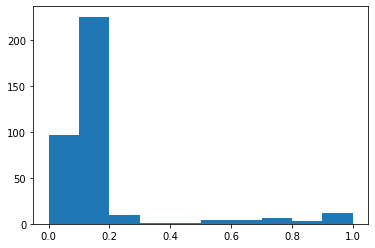

In [38]:
azdias_percentage_nans = azdias.isnull().mean()
plt.hist(azdias_percentage_nans, bins = 10);

There is however, a large number of columns in customers with 20-25% of nan values.

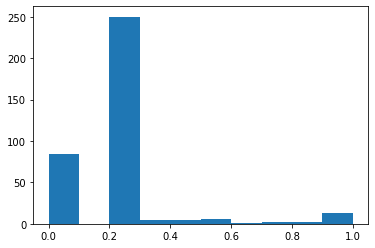

In [39]:
customers_percentage_nans = customers.isnull().mean()
plt.hist(customers_percentage_nans, bins = 10);

We will therefore drop those columns that with more than 

$$
nullc_p = 30 \%
$$

of null values in both azdias and customers. This threshold parameter is of course arbitrary and can be changed if desired.

In [40]:
def drop_nan_cols(df1, df2, nullc_p = .3):
    """
    Drops columns from df1 and df2 with more than null_p percentage of NaN values in both df1 and df2
    
    Inputs: df1, df2 - two data frames, null_p - percentange threshold of number of nan values in a column
    Returns: df1, df2 - dataframes with columns of more than null_p NaN values droped, and list of columns droped
    
    """
    #dictonaries of columns in df1 and df2 with corresponding percentage of Nans
    df1_percentage_nans = df1.isnull().mean()
    df2_percentage_nans = df2.isnull().mean()
    
    #names of colums in df1 and df2 that don't meet the threshold null_p
    nan_cols_df1 = set(df1_percentage_nans[df1_percentage_nans > nullc_p].keys())
    print('Cols in first dataframe to be dropped {} \n'.format(nan_cols_df1))
    
    nan_cols_df2 = set(df2_percentage_nans[df2_percentage_nans > nullc_p].keys())
    print('Cols in second dataframe to be dropped {} \n'.format(nan_cols_df2))
    
    #columns that don't meet the null_p in both df1 and df2
    common_nan_cols = nan_cols_df1.intersection(nan_cols_df2)
    print('Common columns to drop: {} \n'.format(common_nan_cols))
    
    print('A total of {} columns were removed from both dataframes.'.format(len(common_nan_cols)))
    
    #drop the common cols
    df1 = df1.drop(common_nan_cols, axis = 1)
    df2 = df2.drop(common_nan_cols, axis = 1)
    
    return (df1, df2)

In [41]:
azdias, customers = drop_nan_cols(azdias, customers)

Cols in first dataframe to be dropped {'ALTER_KIND4', 'D19_VERSAND_ONLINE_DATUM', 'D19_TELKO_ANZ_12', 'ALTER_KIND1', 'D19_GESAMT_ANZ_24', 'D19_BANKEN_ONLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_BANKEN_ANZ_24', 'D19_GESAMT_ONLINE_DATUM', 'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_DATUM', 'D19_VERSI_ANZ_24', 'KBA05_BAUMAX', 'TITEL_KZ', 'D19_GESAMT_OFFLINE_DATUM', 'D19_GESAMT_ANZ_12', 'D19_TELKO_DATUM', 'D19_BANKEN_ANZ_12', 'D19_VERSI_ANZ_12', 'ALTER_KIND2', 'D19_TELKO_ANZ_24', 'D19_GESAMT_DATUM', 'D19_TELKO_OFFLINE_DATUM', 'EXTSEL992', 'ALTER_KIND3', 'KK_KUNDENTYP', 'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_DATUM', 'AGER_TYP', 'D19_VERSAND_ANZ_24'} 

Cols in second dataframe to be dropped {'ALTER_KIND4', 'D19_VERSAND_ONLINE_DATUM', 'D19_TELKO_ANZ_12', 'ALTER_KIND1', 'D19_GESAMT_ANZ_24', 'D19_BANKEN_ONLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_BANKEN_ANZ_24', 'D19_GESAMT_ONLINE_DATUM', 'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_DATUM', 'D19_VERSI

Now we look at NaNs along rows of our dataframes and decide on a threshold parameter $nullr_c$ to drop rows.

In [42]:
azdias_rows_nan_per = azdias.isnull().sum(axis=1)

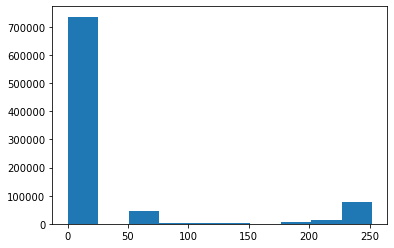

In [43]:
plt.hist(azdias_rows_nan_per, bins =10);

In [44]:
customers_rows_nan_per = customers.isnull().sum(axis=1)

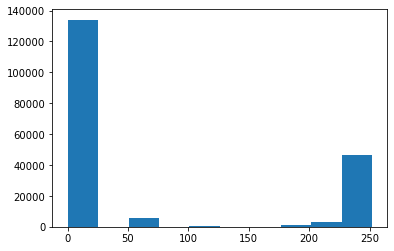

In [45]:
plt.hist(customers_rows_nan_per, bins = 10);

From these two histograms we see that most rows in both dataframes have less than 50 NaNs. Therefore we will drop rows that have more than

$$
nullr_c = 50
$$

NaN values.


In [46]:
azdias.shape[0]

891221

In [47]:
def drop_nan_rows(df, nullr_c = 50):
    """
    Input: Dataframe df and threshold nullr_c
    Returns: Dataframe df after droping those rows with more than nullr_c NaN values
    """
    nans_in_row = df.isnull().sum(axis=1)
    df_droped = df[nans_in_row <= nullr_c]
    original_n_rows = df.shape[0]
    new_n_rows = df_droped.shape[0]
    print('{} rows dropped at {} threshold from the dataframe'.format(original_n_rows - new_n_rows, nullr_c))
    #df_droped = df_droped.reset_index(drop=True)
    return df_droped

In [48]:
azdias = drop_nan_rows(azdias)

153933 rows dropped at 50 threshold from the dataframe


In [49]:
customers = drop_nan_rows(customers)

57406 rows dropped at 50 threshold from the dataframe


In [50]:
azdias.head(20)

,AKT_DAT_KL,ALTER_HH,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
1,9.0,0.0,21.0,11.0,0.0,0.0,2.0,12.0,0.0,3.0,...,4.0,8.0,11.0,10.0,3.0,9.0,4.0,5,2,1
2,9.0,17.0,17.0,10.0,0.0,0.0,1.0,7.0,0.0,3.0,...,2.0,9.0,9.0,6.0,3.0,9.0,2.0,5,2,3
3,1.0,13.0,13.0,1.0,0.0,0.0,0.0,2.0,0.0,2.0,...,0.0,7.0,10.0,11.0,NaN,9.0,7.0,3,2,4
4,1.0,20.0,14.0,3.0,0.0,0.0,4.0,3.0,0.0,4.0,...,2.0,3.0,5.0,4.0,2.0,9.0,3.0,4,1,3
5,1.0,10.0,10.0,5.0,0.0,0.0,1.0,2.0,0.0,2.0,...,2.0,10.0,7.0,4.0,6.0,9.0,7.0,4,2,1
6,9.0,0.0,NaN,4.0,0.0,0.0,1.0,3.0,0.0,4.0,...,2.0,7.0,10.0,10.0,3.0,9.0,5.0,4,2,2
7,1.0,14.0,14.0,6.0,0.0,0.0,1.0,5.0,0.0,2.0,...,2.0,10.0,12.0,9.0,5.0,9.0,1.0,1,1,1
8,9.0,16.0,16.0,2.0,1.0,0.0,1.0,2.0,0.0,2.0,...,4.0,8.0,11.0,8.0,5.0,8.0,1.0,6,1,3
9,5.0,17.0,17.0,9.0,0.0,0.0,1.0,7.0,0.0,2.0,...,4.0,1.0,1.0,1.0,4.0,3.0,7.0,4,2,3
10,1.0,10.0,10.0,6.0,0.0,0.0,1.0,6.0,0.0,4.0,...,4.0,8.0,11.0,10.0,6.0,9.0,5.0,3,2,3


### 6. Categorical Columns

Next we will convert the object variables remaining to dummy variables. We'll do this only to the columns common to both azdias and customers

In [51]:
to_dummies = object_type_cols(azdias).columns
to_dummies 

Index(['D19_LETZTER_KAUF_BRANCHE', 'OST_WEST_KZ'], dtype='object')

In [52]:
def dummies(df, columns = to_dummies):
    df = pd.get_dummies(df, columns = columns)
    return df

In [53]:
azdias = dummies(azdias)
customers = dummies(customers)

### 7. Imputation

Now we use a mean imputer to fill in those remaining NaN values. 

In [54]:
def mean_imputer(df):
    """Fills in NaN values in numerical columns with their mean"""
    num_cols = df.select_dtypes('number')
    df[num_cols.columns] = num_cols.fillna(num_cols.mean())
    return df

In [55]:
azdias = mean_imputer(azdias)
customers = mean_imputer(customers)

In [56]:
azdias.shape, customers.shape

((737288, 367), (134246, 371))

### 8. Cleaning Data Function

We combine the steps above into a single function **clean_data** . The module under the same name can me imported and we can save the cleaned dataframes to load them directly.

In [57]:
import clean_data
#importlib.reload(clean_data);

In [58]:
#load demomographics and customers data
azdias = pd.read_csv('Udacity_AZDIAS_052018.csv', sep=';')
customers = pd.read_csv('Udacity_CUSTOMERS_052018.csv', sep=';')
#load attribute description and unknown values
attributes = pd.read_excel('DIAS Attributes - Values 2017.xlsx', header=1)

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (18,19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [59]:
clean_azdias, clean_customers = clean_data.clean_data(azdias, customers, attributes)

In [60]:
clean_azdias.shape, clean_customers.shape 

((737288, 280), (134246, 283))

In [61]:
clean_azdias.to_csv('clean_azdias.csv', index=False)
clean_customers.to_csv('clean_customers.csv', index=False)